In [1]:
%matplotlib inline

In [37]:
import itertools
import pickle
import gc
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mne
import mne_bids
import librosa as lbr

In [41]:
ROOT = Path("../data/MASC-MEG")

EPOCHS_ID = "12-phoneme-100Hz-800ms-simple-rescale"

EPOCHS_ROOT = Path("../data/formatted/phoneme/")

sorted(EPOCHS_ROOT.rglob(f"*{EPOCHS_ID}*"))

[PosixPath('../data/formatted/phoneme/epochs-12-phoneme-100Hz-800ms-simple-rescale.test.npy'),
 PosixPath('../data/formatted/phoneme/epochs-12-phoneme-100Hz-800ms-simple-rescale.train.npy'),
 PosixPath('../data/formatted/phoneme/info-12-phoneme-100Hz-800ms-simple-rescale.pkl'),
 PosixPath('../data/formatted/phoneme/meta-12-phoneme-100Hz-800ms-simple-rescale.csv')]

In [42]:
train_audio_path = sorted(EPOCHS_ROOT.rglob(f"audio*100Hz-800ms*train*"))[0]
test_audio_path = sorted(EPOCHS_ROOT.rglob(f"audio*100Hz-800ms*test*"))[0]

train_epochs_path = sorted(EPOCHS_ROOT.rglob(f"epochs*{EPOCHS_ID}.train.npy"))[0]
test_epochs_path = sorted(EPOCHS_ROOT.rglob(f"epochs*{EPOCHS_ID}.test.npy"))[0]

info_path = sorted(EPOCHS_ROOT.rglob(f"info*{EPOCHS_ID}.pkl"))[0]
meta_path = sorted(EPOCHS_ROOT.rglob(f"meta*{EPOCHS_ID}.csv"))[0]

In [43]:
phoneme_info = pd.read_csv(ROOT / "phoneme_info.csv")
phoneme_list = phoneme_info.phoneme.tolist()

In [44]:
from pathlib import Path
import yaml


def load_parameters(param_path):
    with open(param_path, "r") as fp:
        params = Parameters(**yaml.load(fp, yaml.Loader))
    return params


class Parameters(dict):
    def __getattr__(self, attr):
        try:
            if isinstance(self[attr], dict):
                return Parameters(**self[attr])
            return self[attr]
        except KeyError:
            raise AttributeError(attr)

    def __getitem__(self, item):
        if item in self:
            if isinstance(self.get(item), dict):
                return Parameters(**self.get(item))
            return self.get(item)
        else:
            raise KeyError(item)

    def __repr__(self):
        return "Parameters " + super(Parameters, self).__repr__()

    def __str__(self):
        return "Parameters " + super(Parameters, self).__str__()

    @property
    def sfreq(self):
        if "epochs" in self and "decim" in self.epochs:
            return self.sampling_rate / self.epochs.decim
        else:
            return self.sampling_rate

    def save(self, path):
        with open(path, "w+") as fp:
            yaml.dump(dict(**self), fp)

In [63]:
P = load_parameters(Path("../config/decim-10-const-rescale.yaml"))
pd.DataFrame(P)

,meg,epochs,sound,test_story,seed
sfreq,1000,100,22050,lw1,54321
bandpass,"{'high': 30.0, 'low': 0.5}",NaN,NaN,lw1,54321
scaler,const,NaN,NaN,lw1,54321
scaler_params,"{'quantile_range': [0.5, 95.0], 'coef': 100000...",NaN,NaN,lw1,54321
clip,"[None, None]",NaN,NaN,lw1,54321
decim,NaN,10,NaN,lw1,54321
tmin,NaN,-0.2,NaN,lw1,54321
tmax,NaN,0.6,NaN,lw1,54321
baseline,NaN,"[-0.2, 0.0]",NaN,lw1,54321
epoch_length,NaN,81,NaN,lw1,54321


In [64]:
meta = pd.read_csv(meta_path)

In [65]:
with open(info_path, "rb+") as fp:
    info = pickle.load(fp)

In [66]:
X_train = np.load(train_audio_path)

In [67]:
y_train = np.load(train_epochs_path)

In [68]:
X_train.shape, y_train.shape

((30761, 81, 208), (30761, 81, 208))

In [106]:
X_train_d = lbr.feature.delta(X_train, axis=1)

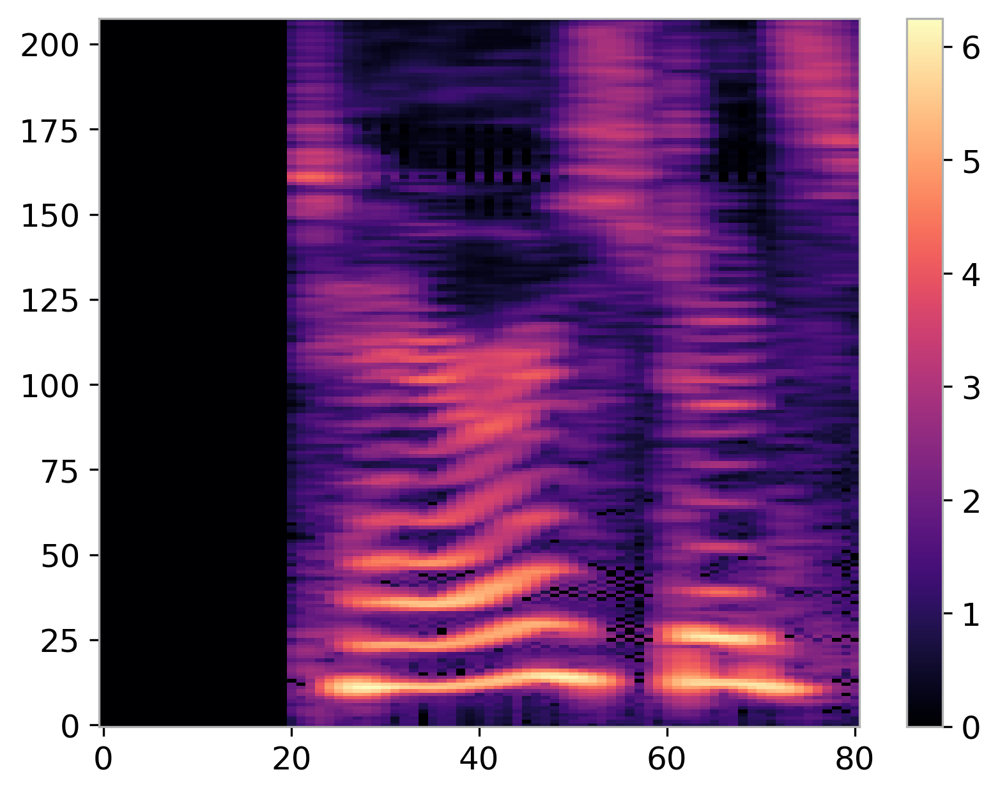

In [113]:
plt.imshow(X_train[0].T, aspect='auto', origin="lower")
plt.colorbar()
plt.show()

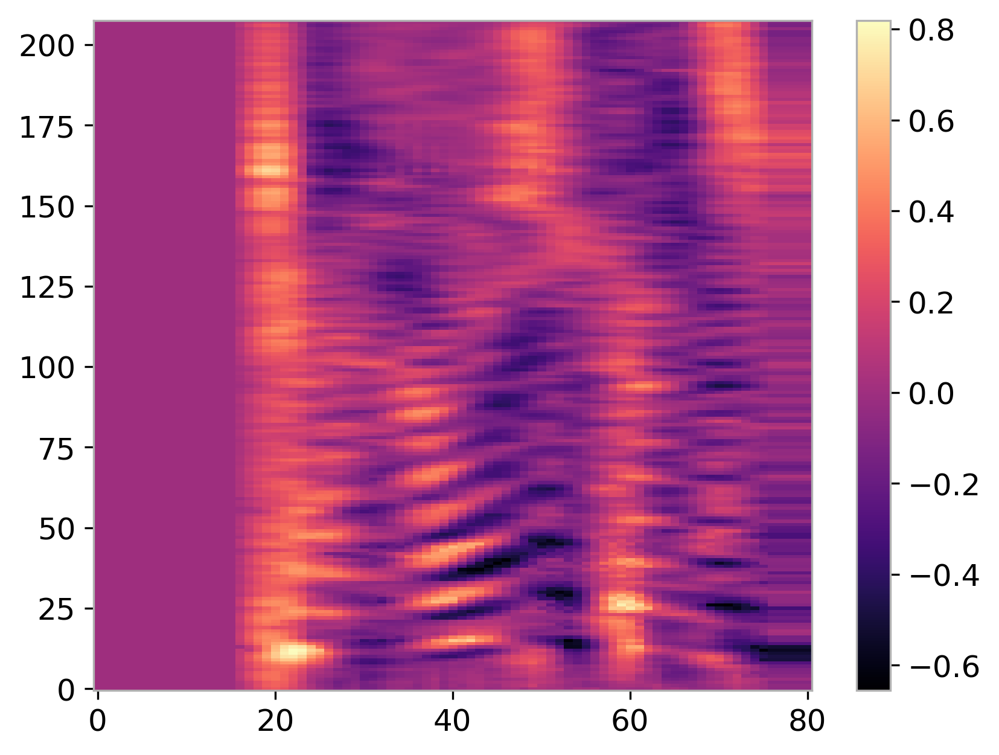

In [112]:
plt.imshow(X_train_d[0].T, aspect='auto', origin="lower")
plt.colorbar()
plt.show()

In [114]:
N, T, n_mels = X_train.shape

In [115]:
_, _, n_chns = y_train.shape

In [116]:
true_epochs = mne.EpochsArray(np.swapaxes(y_train, 1, 2), info, metadata=meta)

Adding metadata with 26 columns
30761 matching events found
No baseline correction applied
0 projection items activated


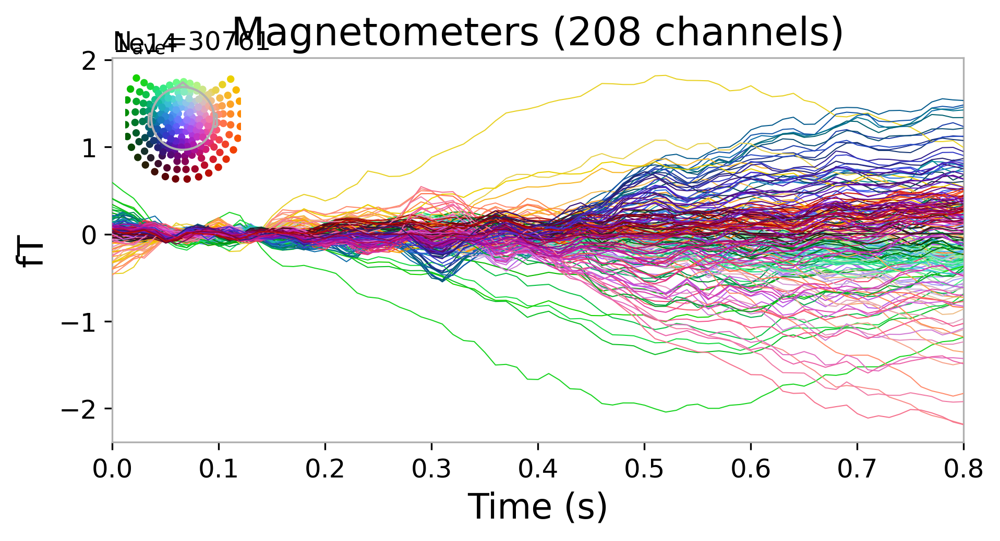

In [117]:
true_epochs.average().plot()
plt.show()

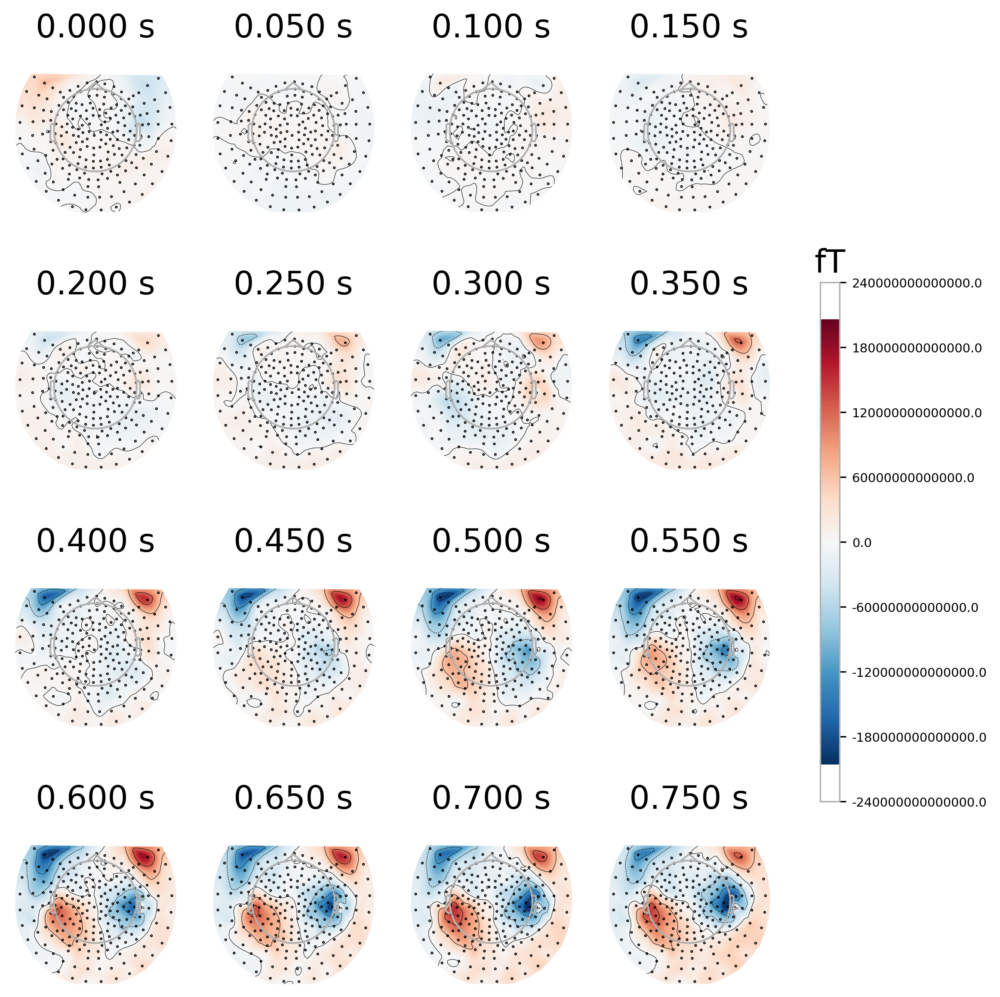

In [73]:
times = np.arange(0.00, 0.8, 0.05)
true_epochs.average().plot_topomap(times=times, nrows=4, ncols=4)
plt.show()

In [120]:
P_read = Parameters(**dict(
    ridge = 1e-6
))

P_res = Parameters(**dict(
    units=500,
    input_scaling=1.0,
    input_bias=False,
    W=dict(params=dict(low=-0.5, high=0.5)),
    input_connectivity=0.1,
    rc_connectivity=0.1,
    lr = 0.8,
    sr = 0.99,
))

P.readout = P_read
P.reservoir = P_res

In [121]:
from pprint import pprint

pprint(P_read)
pprint(P_res)

Parameters {'ridge': 1e-06}
{'W': {'params': {'high': 0.5, 'low': -0.5}},
 'input_bias': False,
 'input_connectivity': 0.1,
 'input_scaling': 1.0,
 'lr': 0.8,
 'rc_connectivity': 0.1,
 'sr': 0.99,
 'units': 500}


In [122]:
from reservoirpy import mat_gen
from reservoirpy.nodes import Reservoir, Ridge, ESN
import reservoirpy as rpy
from reservoirpy import mat_gen

#W = getattr(mat_gen, P_res.W.dist)(**P_res.W.params)

rpy.verbosity(0)
rpy.set_seed(P.seed)

reservoir = Reservoir(
    P_res.units, 
    lr=P_res.lr, 
    sr=P_res.sr,
    input_scaling=P_res.input_scaling,
    input_bias=P_res.input_bias,
    #W=W,
    rc_connectivity=P_res.rc_connectivity,
    input_connectivity=P_res.input_connectivity
)

readout = Ridge(ridge=P_read.ridge)

esn = ESN(reservoir=reservoir, readout=readout, workers=-1)

In [123]:
if P.epochs.baseline is not None:
    warmup = round((P.epochs.baseline[1] - P.epochs.baseline[0]) * P.epochs.sfreq)
else:
    warmup = 0
print(warmup)

20


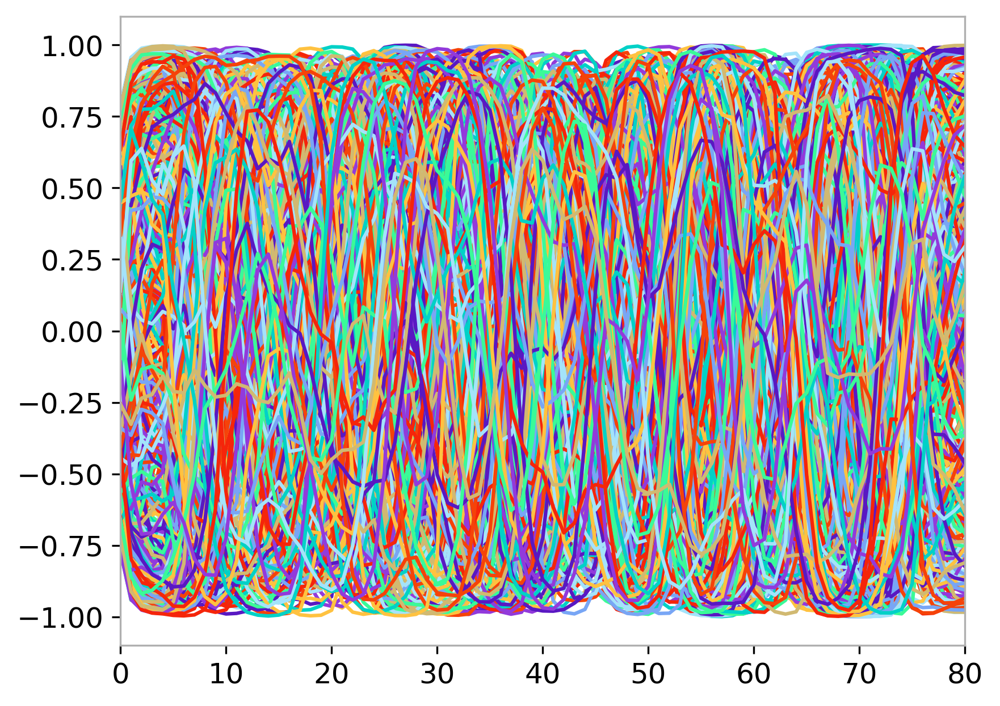

In [124]:
states = reservoir.run(X_train_d[20])
plt.plot(states)
plt.show()

In [131]:
esn = esn.fit(X_train_d, y_train, warmup=0)

In [134]:
X_test = np.load(test_audio_path)
X_test_d = lbr.feature.delta(X_test, axis=1)
y_test = np.load(test_epochs_path)

In [135]:
y_pred = esn.run(X_test_d)

In [136]:
pred_epochs = mne.EpochsArray(np.swapaxes(np.r_[y_pred] / 1e13, 1, 2), info)

Not setting metadata
2462 matching events found
No baseline correction applied
0 projection items activated


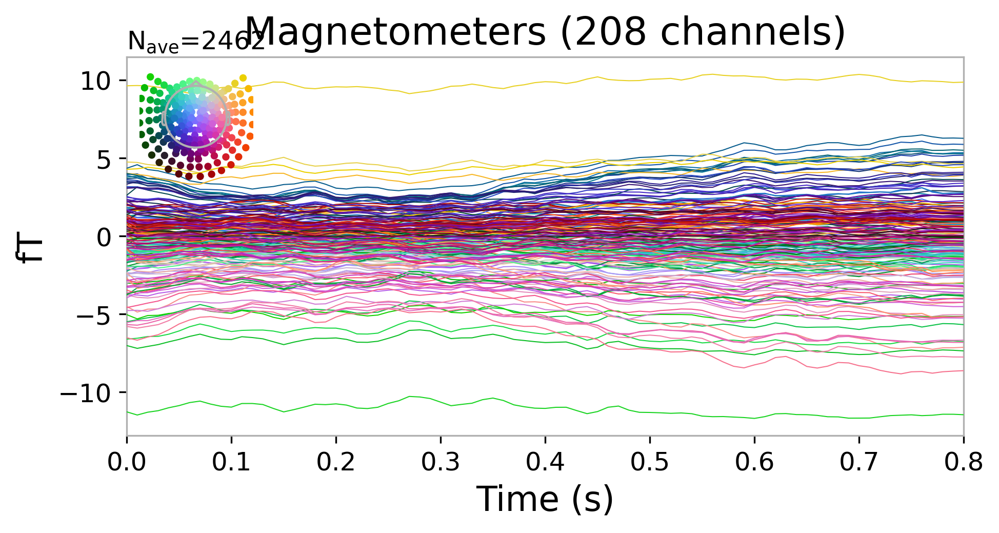

In [137]:
pred_epochs.average().plot()
plt.show()

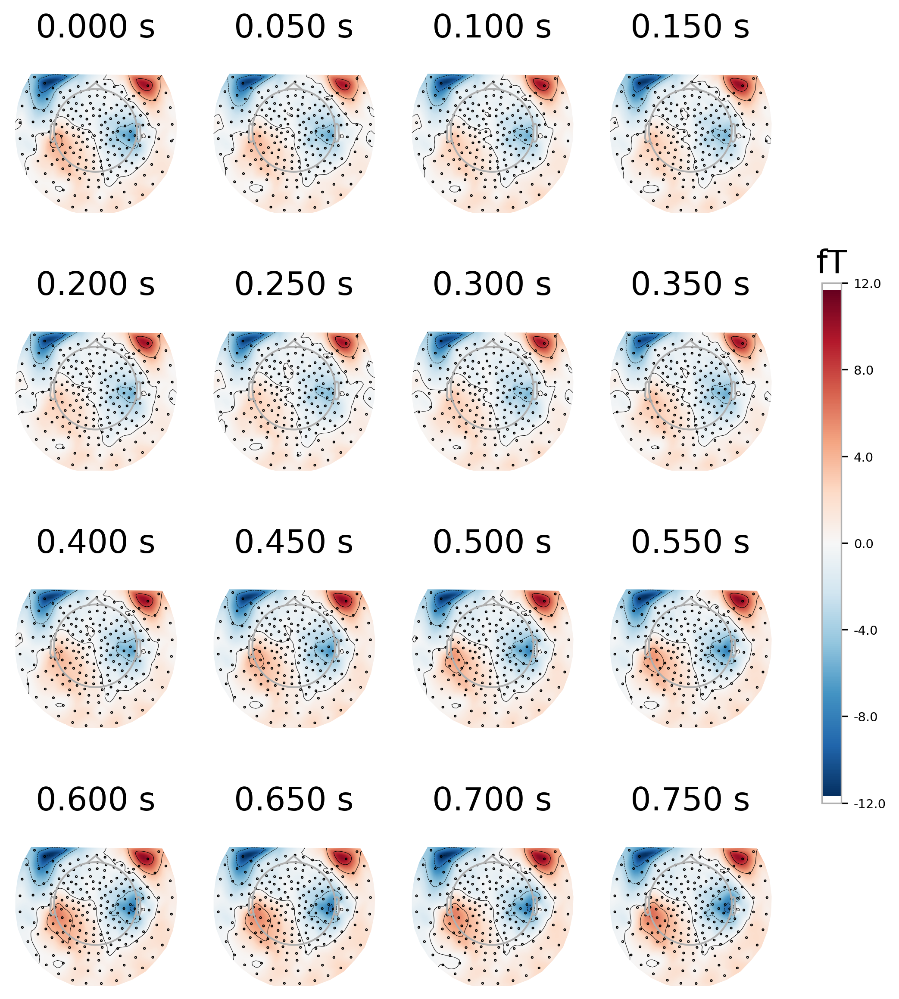

In [138]:
times = np.arange(0.00, 0.8, 0.05)
pred_epochs.average().plot_topomap(times=times, nrows = 4, ncols=4)
plt.show()

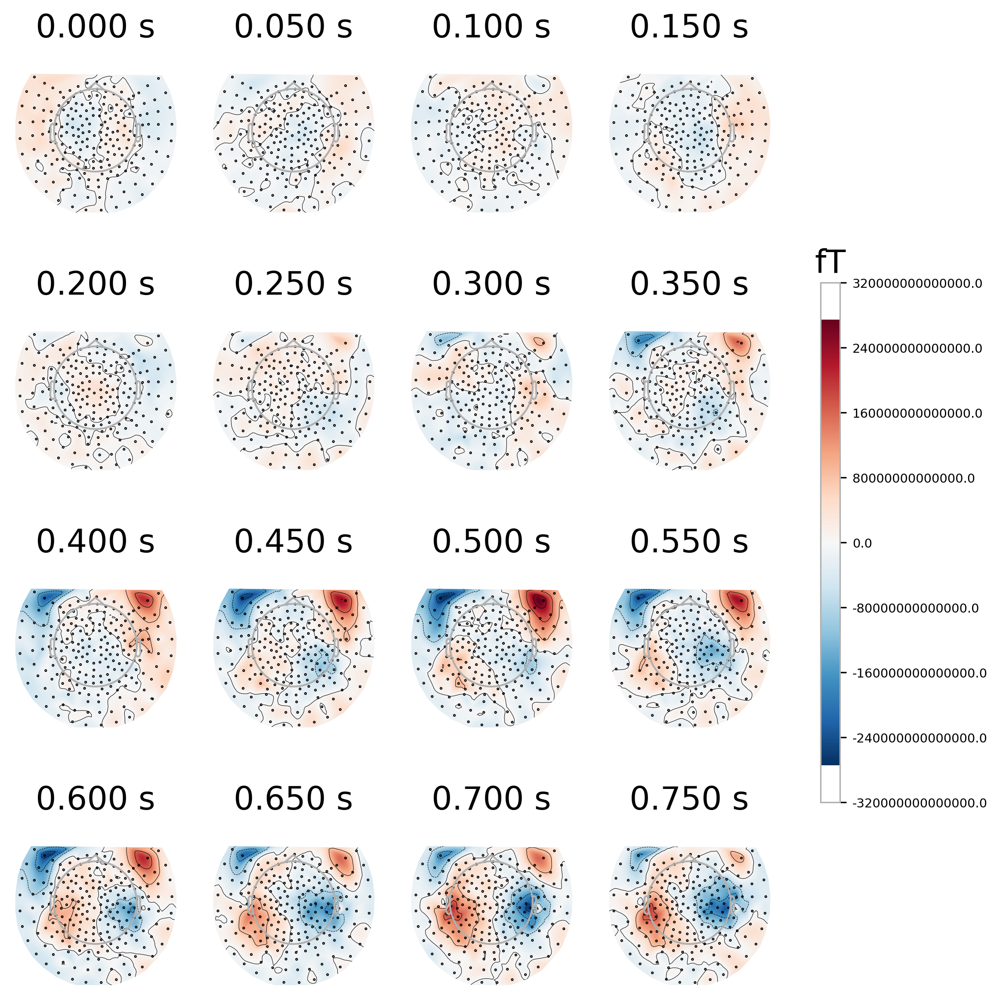

In [85]:
times = np.arange(0.00, 0.8, 0.05)
true_epochs.average().plot_topomap(times=times, nrows = 4, ncols=4)
plt.show()

In [86]:
from scipy.stats import zscore


def corr(X,Y):
    return np.mean(zscore(X)*zscore(Y),0)

def R2(Pred,Real):
    SSres = np.mean((Real-Pred)**2,0)
    SStot = np.var(Real,0)
    return np.nan_to_num(1-SSres/SStot)

def R2r(Pred,Real):
    R2rs = R2(Pred,Real)
    ind_neg = R2rs<0
    R2rs = np.abs(R2rs)
    R2rs = np.sqrt(R2rs)
    R2rs[ind_neg] *= - 1
    return R2rs

In [87]:
pearson_c = corr(np.r_[y_pred].reshape(-1, n_chns), y_test.reshape(-1, n_chns))
r2_c = R2(np.r_[y_pred].reshape(-1, n_chns), y_test.reshape(-1, n_chns))

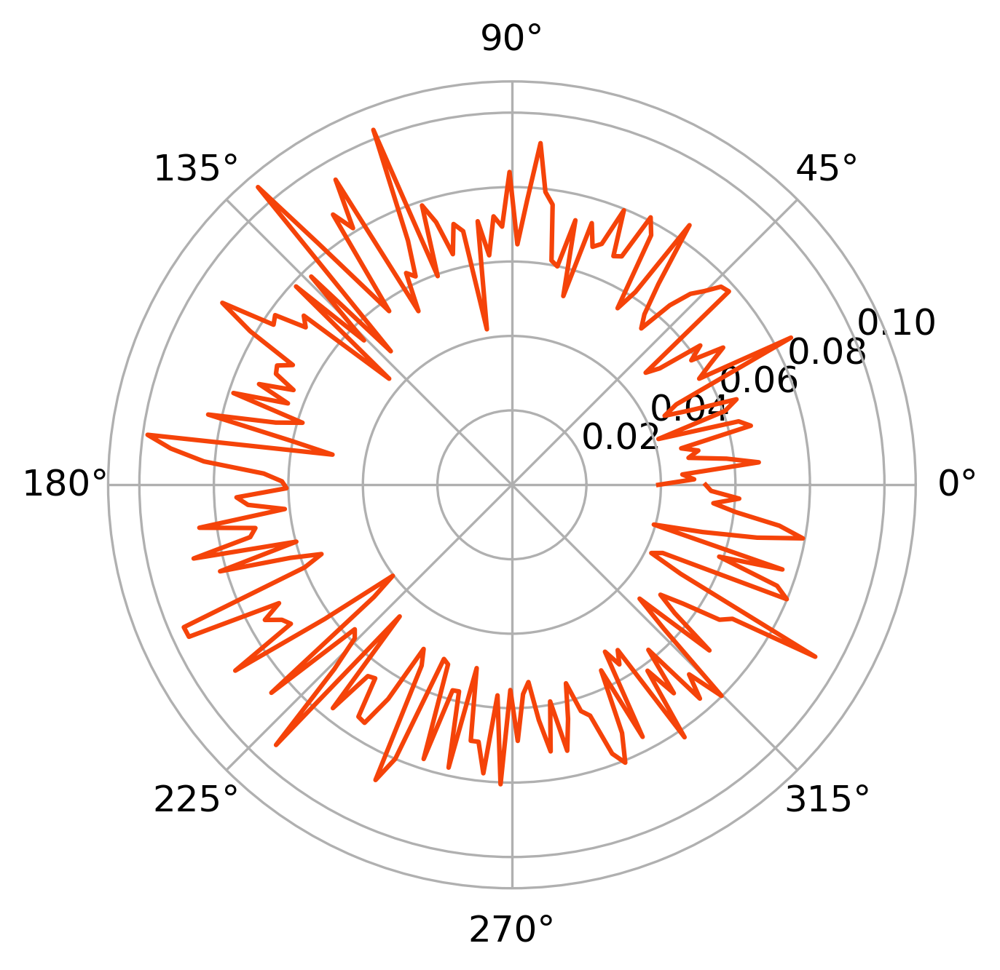

In [88]:
theta = np.linspace(0, 2*np.pi, n_chns)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, pearson_c)
ax.grid(True)
plt.show()

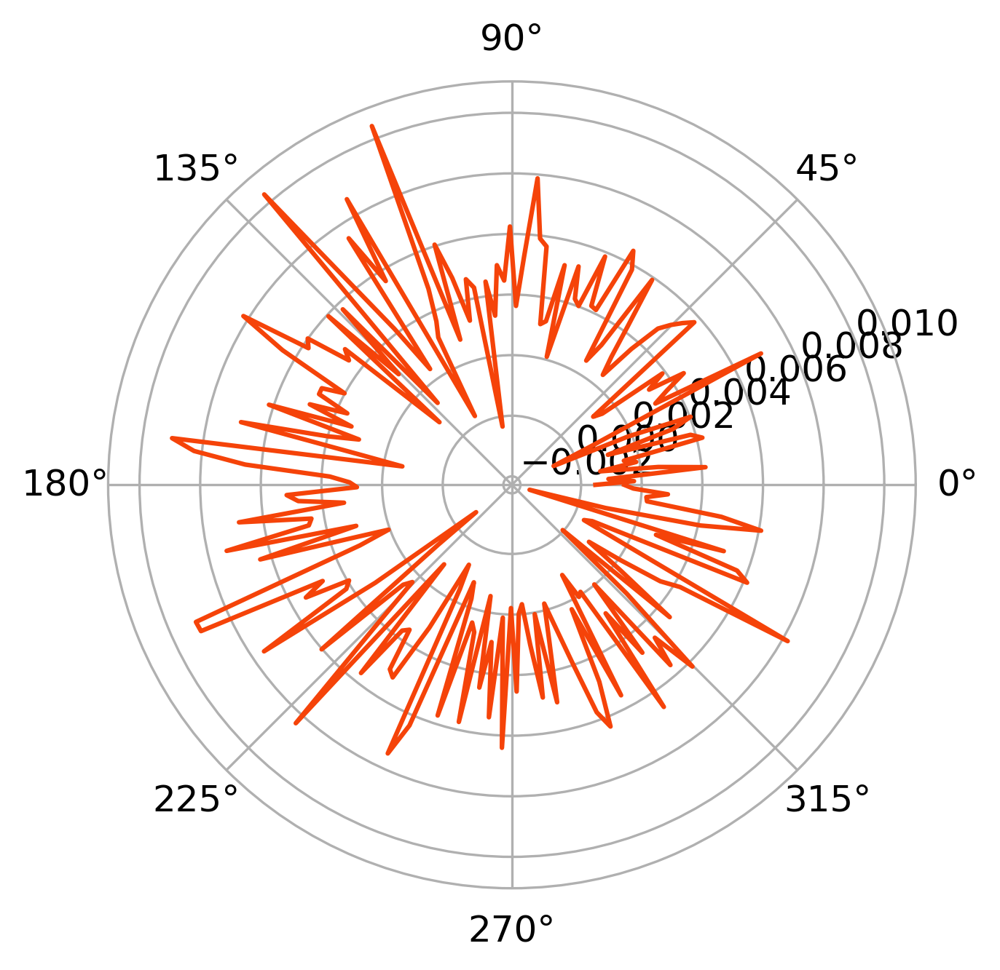

In [89]:
theta = np.linspace(0, 2*np.pi, n_chns)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, r2_c)
ax.grid(True)
plt.show()

In [134]:
from sklearn.linear_model import Ridge

ridge = Ridge(alpha=1e-6)

In [ ]:
ridge = ridge.fit(X_train.reshape(-1, n_mels), y_train.reshape(-1, n_chns))